In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=100)
    


import matplotlib.pyplot as pl
from matplotlib import rcParams

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [2]:
raw = sc.read('/Users/fengxu/sc-RNA/WT_Mga_raw.h5ad')
raw

AnnData object with n_obs × n_vars = 59007 × 32285
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [3]:
adata_T_processed = sc.read('/Users/fengxu/sc-RNA/adata_T_processed.h5ad')
adata_T_processed

AnnData object with n_obs × n_vars = 2660 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
raw.obs['cell_type']= adata_T_processed.obs['cell_type']
adata_T=raw[raw.obs['cell_type'].isin(['T cells'])]
adata_T

View of AnnData object with n_obs × n_vars = 2660 × 32285
    obs: 'batch', 'cell_type'
    var: 'gene_ids', 'feature_types'

In [5]:
adata_T.write('/Users/fengxu/sc-RNA/adata_T_raw.h5ad', compression='gzip')
adata_T

View of AnnData object with n_obs × n_vars = 2660 × 32285
    obs: 'batch', 'cell_type'
    var: 'gene_ids', 'feature_types'

normalizing counts per cell
    finished (0:00:00)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


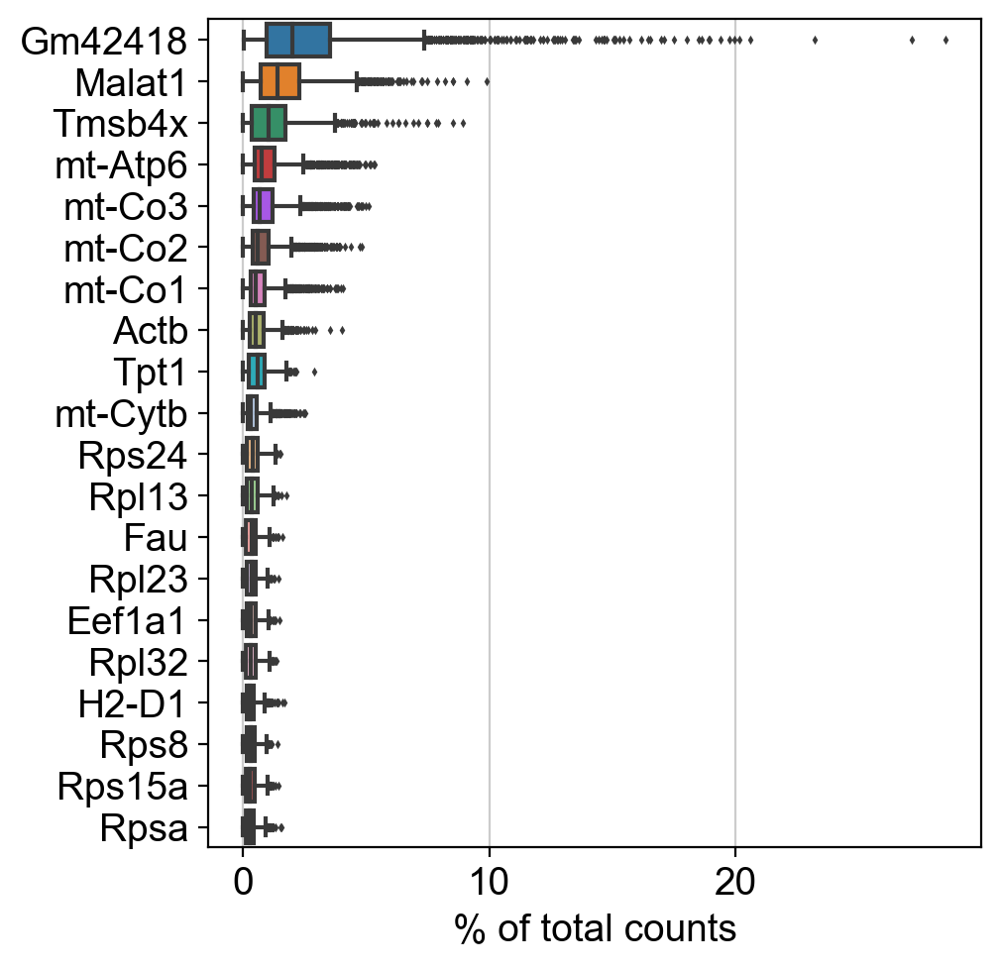

filtered out 17634 genes that are detected in less than 10 cells


In [6]:
sc.pl.highest_expr_genes(adata_T, n_top=20)
sc.pp.filter_cells(adata_T, min_genes=200)
sc.pp.filter_genes(adata_T, min_cells=10)

In [7]:
adata_T.var['mt'] = adata_T.var_names.str.startswith('mt-')
adata_T.var['rpl'] = adata_T.var_names.str.startswith('Rpl')
adata_T.var['rps'] = adata_T.var_names.str.startswith('Rps')
adata_T

AnnData object with n_obs × n_vars = 2660 × 14651
    obs: 'batch', 'cell_type', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps'

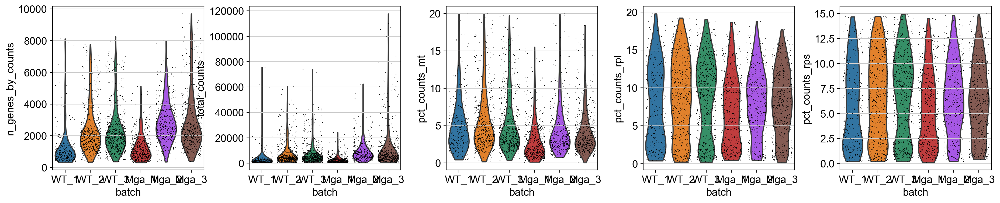

AnnData object with n_obs × n_vars = 2660 × 14651
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [8]:
sc.pp.calculate_qc_metrics(adata_T, qc_vars=['mt','rpl','rps'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata_T, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rpl','pct_counts_rps'], jitter=0.4, groupby = 'batch',multi_panel=True)
adata_T

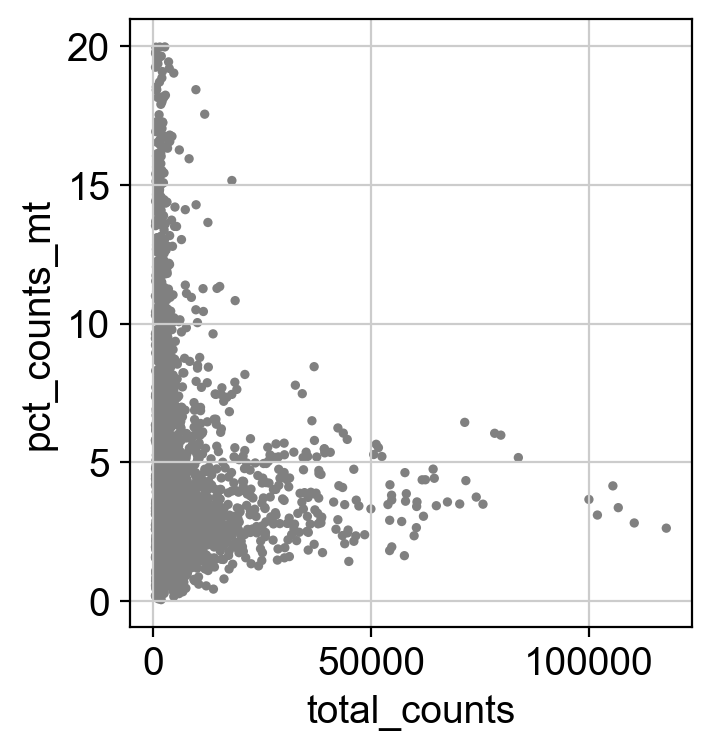

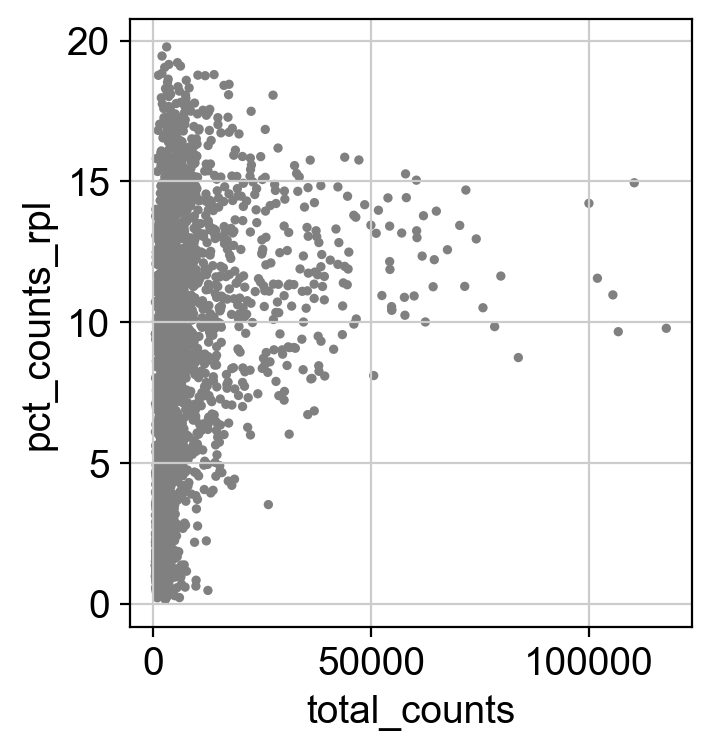

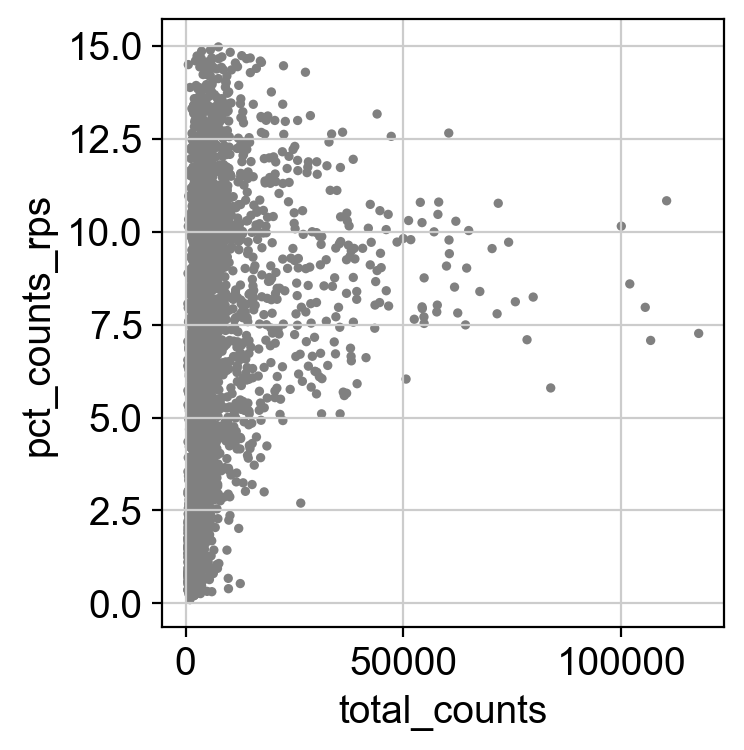

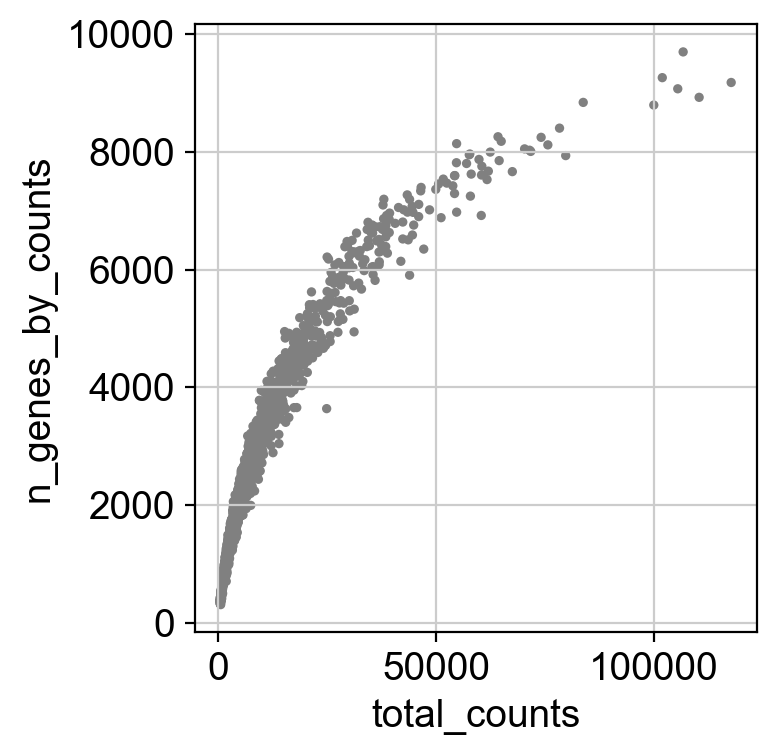

In [9]:
sc.pl.scatter(adata_T, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata_T, x='total_counts', y='pct_counts_rpl')
sc.pl.scatter(adata_T, x='total_counts', y='pct_counts_rps')
sc.pl.scatter(adata_T, x='total_counts', y='n_genes_by_counts')

In [10]:
adata_T = adata_T[adata_T.obs.n_genes_by_counts < 9000, :]
adata_T = adata_T[adata_T.obs.pct_counts_mt < 20, :]
adata_T = adata_T[adata_T.obs.pct_counts_rpl < 20, :]
adata_T = adata_T[adata_T.obs.pct_counts_rps < 15, :]
adata_T

View of AnnData object with n_obs × n_vars = 2656 × 14651
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [11]:
sc.pp.normalize_total(adata_T, target_sum=1e4)
sc.pp.log1p(adata_T)
adata_T

normalizing counts per cell
    finished (0:00:00)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 2656 × 14651
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors', 'log1p'

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


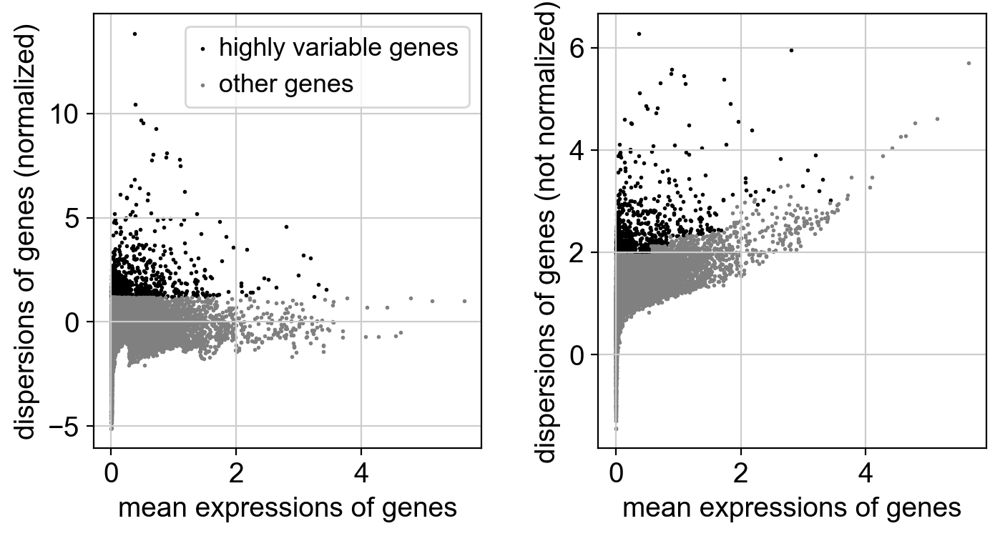

1000


AnnData object with n_obs × n_vars = 2656 × 14651
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [12]:
sc.pp.highly_variable_genes(adata_T, n_top_genes=1000)
sc.pl.highly_variable_genes(adata_T)
print(sum(adata_T.var.highly_variable))
adata_T

In [13]:
adata_T.raw=adata_T

In [14]:
adata_T = adata_T[:, adata_T.var.highly_variable]
adata_T

View of AnnData object with n_obs × n_vars = 2656 × 1000
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [15]:
sc.pp.regress_out(adata_T, keys=['total_counts', 'pct_counts_mt','pct_counts_rpl','pct_counts_rps'], n_jobs=10)
sc.pp.scale(adata_T, max_value=10)
adata_T

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rpl', 'pct_counts_rps']
    sparse input is densified and may lead to high memory use
    finished (0:00:01)


AnnData object with n_obs × n_vars = 2656 × 1000
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg'

In [16]:
sc.tl.pca(adata_T, svd_solver='arpack')
sce.pp.harmony_integrate(adata_T, key='batch', basis='X_pca', adjusted_basis='X_pca_harmony')
adata_T.obsm['X_pca']=adata_T.obsm['X_pca_harmony']
sc.pp.neighbors(adata_T, n_neighbors=10, n_pcs=40, knn=True)
sc.tl.leiden(adata_T, resolution=1.0, key_added = "leiden")
sc.tl.umap(adata_T)
adata_T

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:40)


2023-11-08 15:28:03,661 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-11-08 15:28:06,186 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-11-08 15:28:06,201 - harmonypy - INFO - Iteration 1 of 10
2023-11-08 15:28:06,492 - harmonypy - INFO - Iteration 2 of 10
2023-11-08 15:28:06,799 - harmonypy - INFO - Iteration 3 of 10
2023-11-08 15:28:07,031 - harmonypy - INFO - Iteration 4 of 10
2023-11-08 15:28:07,255 - harmonypy - INFO - Iteration 5 of 10
2023-11-08 15:28:07,410 - harmonypy - INFO - Iteration 6 of 10
2023-11-08 15:28:07,555 - harmonypy - INFO - Iteration 7 of 10
2023-11-08 15:28:07,678 - harmonypy - INFO - Iteration 8 of 10
2023-11-08 15:28:07,800 - harmonypy - INFO - Iteration 9 of 10
2023-11-08 15:28:07,916 - harmonypy - INFO - Converged after 9 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


AnnData object with n_obs × n_vars = 2656 × 1000
    obs: 'batch', 'cell_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


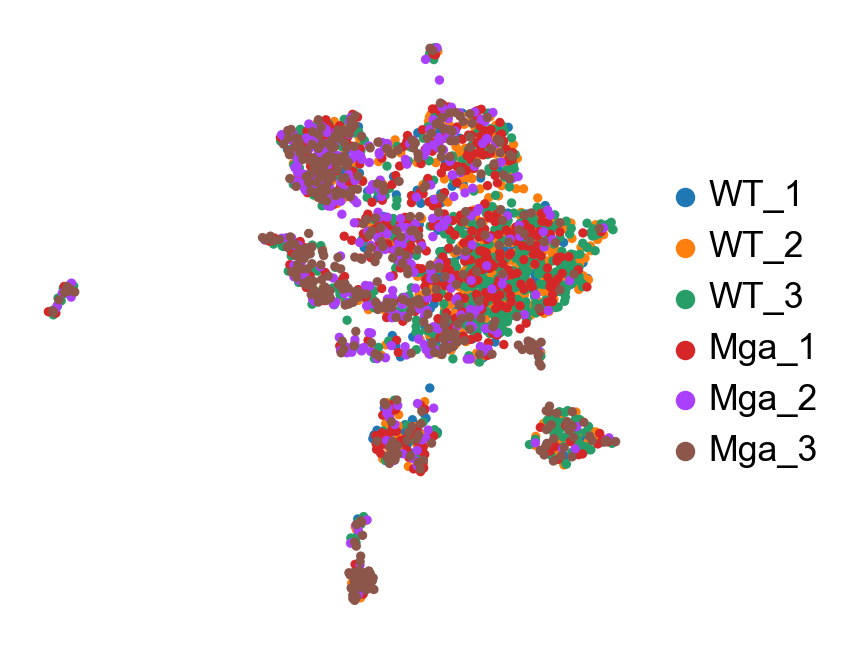

In [17]:
sc.pl.umap(adata_T, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


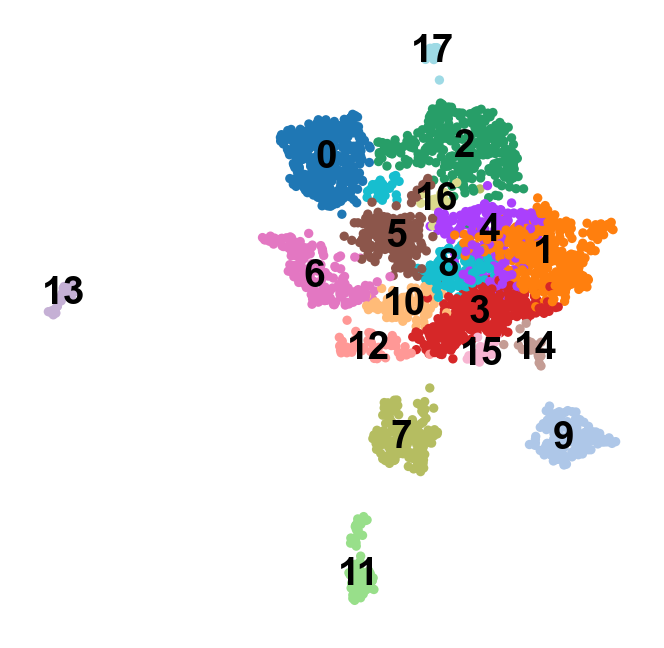

In [18]:
sc.pl.umap(adata_T, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


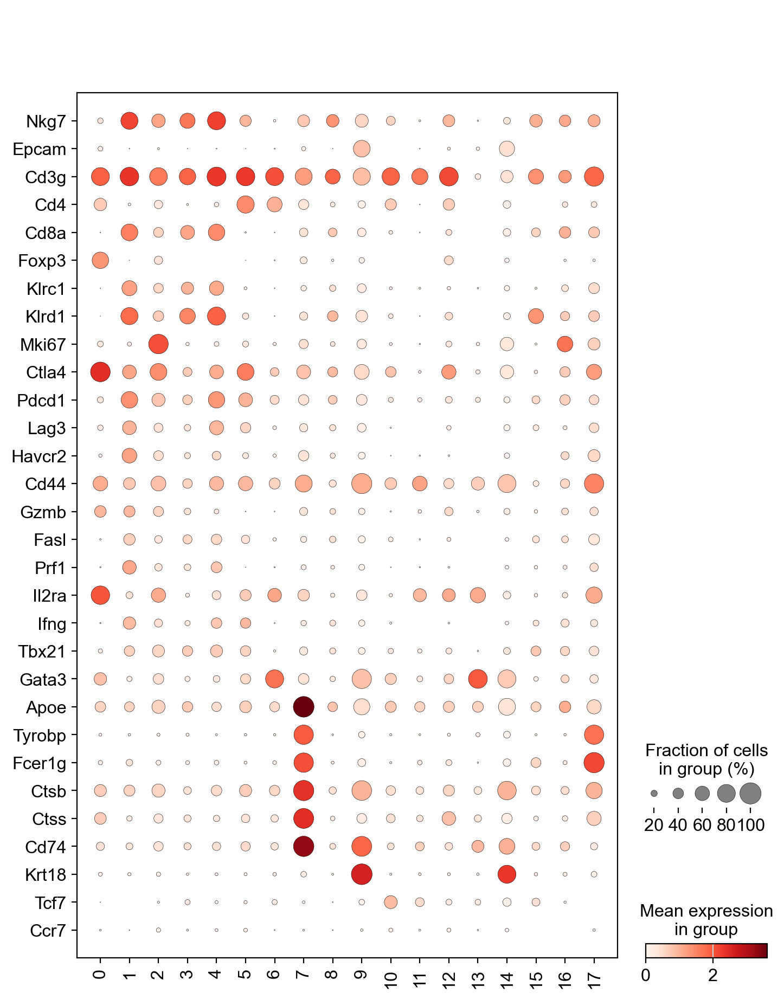

In [66]:
sc.pl.dotplot(adata_T, var_names=['Nkg7','Epcam','Cd3g','Cd4','Cd8a','Foxp3','Klrc1','Klrd1','Mki67','Ctla4','Pdcd1','Lag3','Havcr2','Cd44','Gzmb','Fasl','Prf1','Il2ra','Ifng','Tbx21','Gata3','Apoe','Tyrobp','Fcer1g','Ctsb','Ctss','Cd74','Krt18','Tcf7','Ccr7'], groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


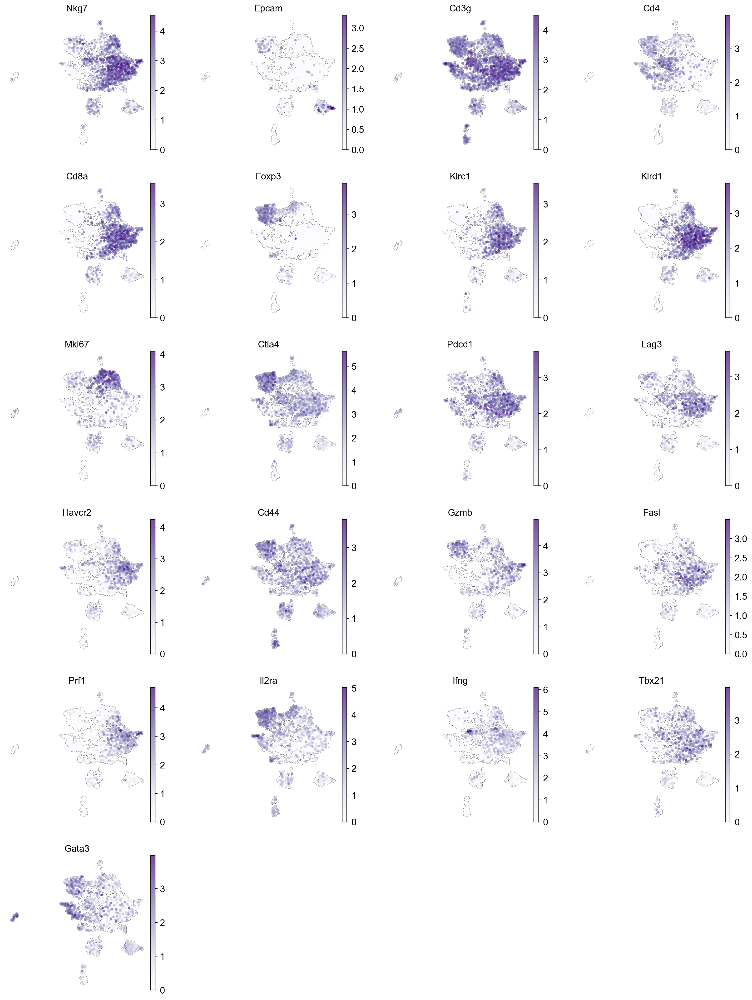

In [54]:
sc.pl.umap(adata_T, color=['Nkg7','Epcam','Cd3g','Cd4','Cd8a','Foxp3','Klrc1','Klrd1','Mki67','Ctla4','Pdcd1','Lag3','Havcr2','Cd44','Gzmb','Fasl','Prf1','Il2ra','Ifng','Tbx21','Gata3'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples')

In [55]:
sc.tl.rank_genes_groups(adata_T, groupby='leiden', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  se

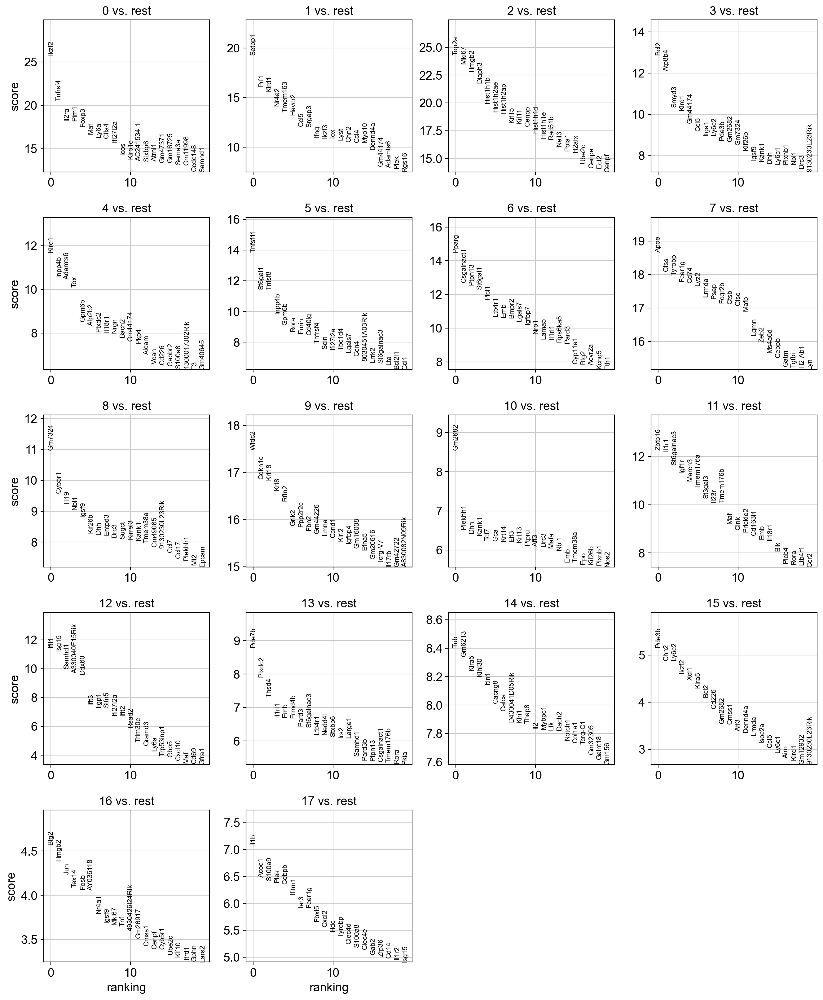

In [56]:
sc.pl.rank_genes_groups(adata_T, n_genes=20, sharey=False)

In [69]:
adata_T.obs['cell_type'] = (adata_T.obs['leiden'].map
                              (lambda x: {'0': 'Treg', '1': 'Exhausted Cd8', '2': 'Mki67+ T', '3': 'Effector Cd8', '4':'Exhausted Cd8', '5': 'Th1 Cd4',
                                          '6': 'Th2 Cd4', '7': 'Cd74+ T', '8': 'Effector Cd8', '9':'Unclassified',
                                          '10': 'Tcf7+ T', '11': 'Double negative T', '12': 'Unclassified', '13':'Unclassified', '14': 'Unclassified','15': 'Effector Cd8','16': 'Mki67+ T','17': 'Unclassified'}.get(x, x)).astype("category"))

In [70]:
adata_T.obs['cell_type'].cat.reorder_categories(['Treg','Exhausted Cd8','Mki67+ T','Effector Cd8','Th1 Cd4','Th2 Cd4','Cd74+ T','Tcf7+ T','Double negative T','Unclassified'])

AAACGAAGTTGGGTAG-1-WT_1      Effector Cd8
AAAGGTAGTGTTGAGG-1-WT_1      Effector Cd8
AAAGTCCAGTCTGGAG-1-WT_1           Tcf7+ T
AACAACCGTTAGAAGT-1-WT_1     Exhausted Cd8
AACAAGAAGATTGTGA-1-WT_1      Effector Cd8
                                ...      
TTTACCAGTATCTTCT-1-Mga_3             Treg
TTTCAGTGTCGCCTAG-1-Mga_3          Th2 Cd4
TTTCCTCCACCGCTGA-1-Mga_3     Unclassified
TTTGATCAGATCCCGC-1-Mga_3             Treg
TTTGTTGGTTGCTAGT-1-Mga_3          Tcf7+ T
Name: cell_type, Length: 2656, dtype: category
Categories (10, object): ['Treg', 'Exhausted Cd8', 'Mki67+ T', 'Effector Cd8', ..., 'Cd74+ T', 'Tcf7+ T', 'Double negative T', 'Unclassified']

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


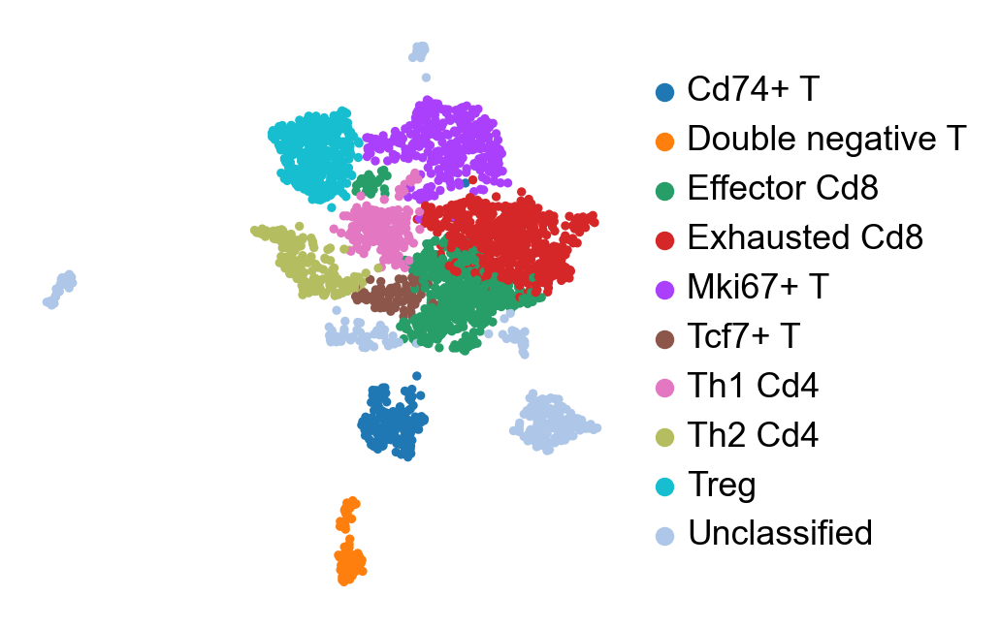

In [85]:
sc.pl.umap(adata_T, color=['cell_type'],legend_loc='right margin', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


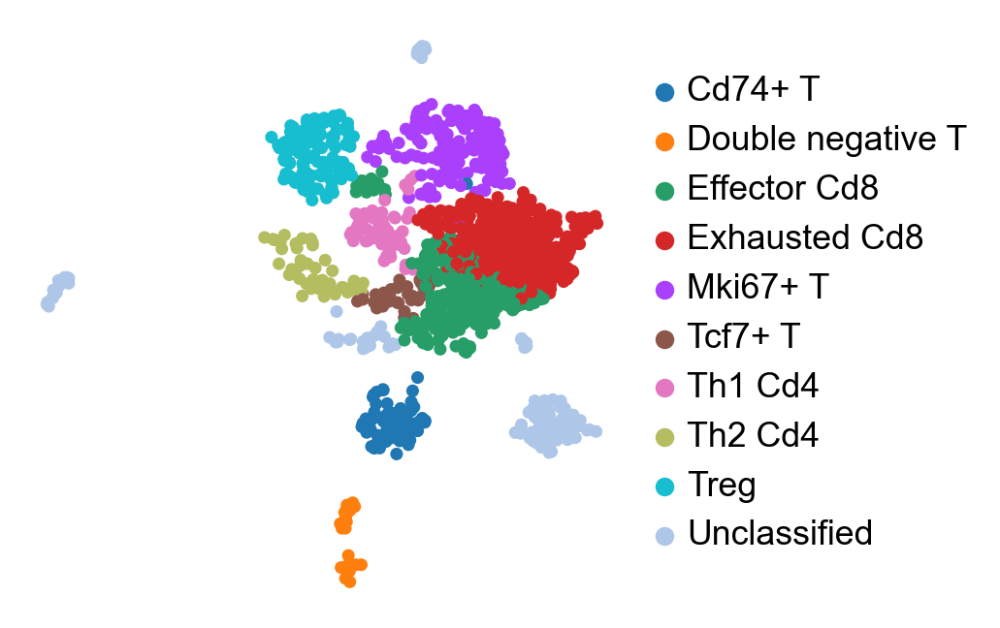

In [72]:
sc.pl.umap(adata_T[adata_T.obs['batch'].isin(['WT_1','WT_2','WT_3'])], color=['cell_type'], legend_loc='right margin', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


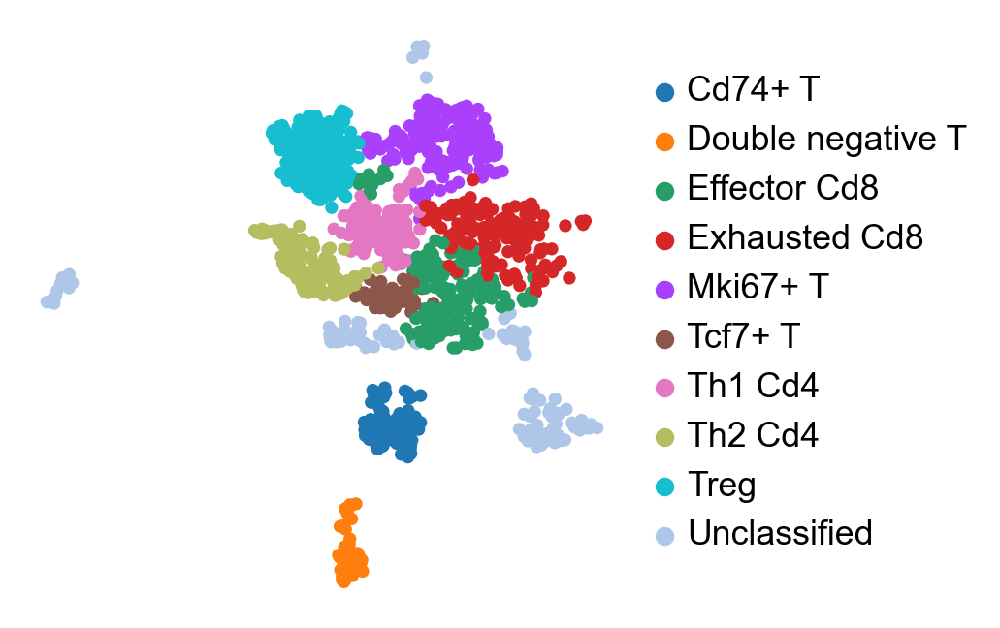

In [73]:
sc.pl.umap(adata_T[adata_T.obs['batch'].isin(['Mga_1','Mga_2','Mga_3'])], color=['cell_type'], legend_loc='right margin', frameon=False, title='', use_raw=True)

In [1]:
sc.pl.dotplot(adata_T, var_names=['Cd3g','Cd4','Cd8a','Klrd1','Mki67','Foxp3','Ctla4','Pdcd1','Lag3','Havcr2','Gzmb','Fasl','Prf1','Il2ra','Ifng','Tbx21','Gata3','Cd74','Tcf7','Krt18'], groupby='cell_type', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0)

NameError: name 'sc' is not defined

In [74]:
adata_T[adata_T.obs['batch']=='WT_1'].obs['cell_type'].value_counts()

cell_type
Effector Cd8         82
Exhausted Cd8        65
Mki67+ T             35
Cd74+ T              23
Unclassified         22
Treg                 16
Th1 Cd4              13
Tcf7+ T               6
Double negative T     3
Th2 Cd4               2
Name: count, dtype: int64

In [75]:
adata_T[adata_T.obs['batch']=='WT_2'].obs['cell_type'].value_counts()

cell_type
Exhausted Cd8        156
Effector Cd8          95
Mki67+ T              73
Treg                  52
Unclassified          48
Cd74+ T               25
Th1 Cd4               18
Double negative T      9
Tcf7+ T                8
Th2 Cd4                7
Name: count, dtype: int64

In [77]:
adata_T[adata_T.obs['batch']=='WT_3'].obs['cell_type'].value_counts()

cell_type
Exhausted Cd8        192
Effector Cd8         120
Unclassified          70
Mki67+ T              52
Treg                  52
Th2 Cd4               34
Th1 Cd4               29
Cd74+ T               18
Tcf7+ T               17
Double negative T     11
Name: count, dtype: int64

In [78]:
adata_T[adata_T.obs['batch']=='Mga_1'].obs['cell_type'].value_counts()

cell_type
Exhausted Cd8        98
Effector Cd8         81
Mki67+ T             73
Treg                 59
Th1 Cd4              53
Cd74+ T              39
Unclassified         30
Th2 Cd4              22
Tcf7+ T              12
Double negative T     3
Name: count, dtype: int64

In [79]:
adata_T[adata_T.obs['batch']=='Mga_2'].obs['cell_type'].value_counts()

cell_type
Treg                 89
Mki67+ T             54
Effector Cd8         44
Unclassified         38
Th1 Cd4              36
Th2 Cd4              32
Exhausted Cd8        26
Cd74+ T              23
Tcf7+ T              18
Double negative T     7
Name: count, dtype: int64

In [80]:
adata_T[adata_T.obs['batch']=='Mga_3'].obs['cell_type'].value_counts()

cell_type
Treg                 98
Th2 Cd4              72
Unclassified         64
Mki67+ T             47
Effector Cd8         44
Double negative T    43
Th1 Cd4              29
Cd74+ T              26
Exhausted Cd8        23
Tcf7+ T              20
Name: count, dtype: int64

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


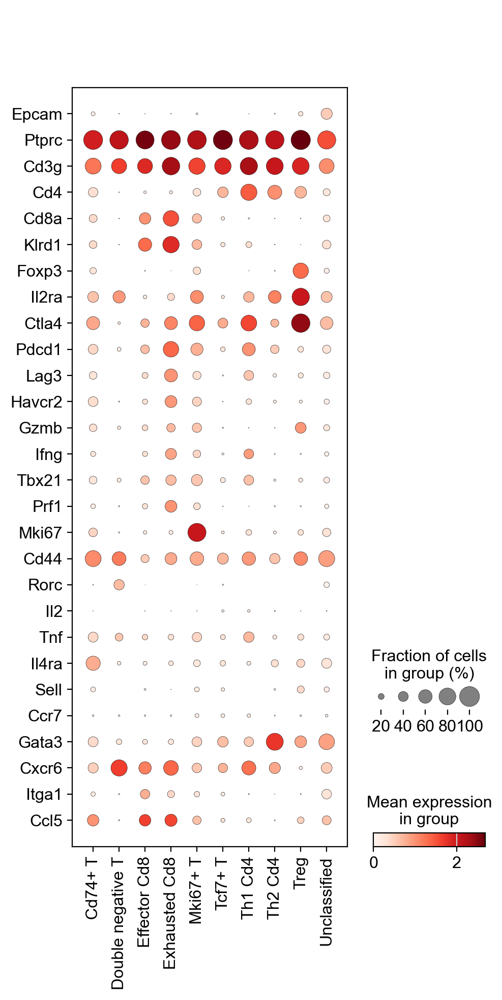

In [84]:
sc.pl.dotplot(adata_T, var_names=['Epcam','Ptprc','Cd3g','Cd4','Cd8a','Klrd1','Foxp3','Il2ra','Ctla4','Pdcd1','Lag3','Havcr2','Gzmb','Ifng','Tbx21','Prf1','Mki67','Cd44','Rorc','Il2','Tnf','Il4ra','Sell','Ccr7','Gata3','Cxcr6','Itga1','Ccl5'], groupby='cell_type', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


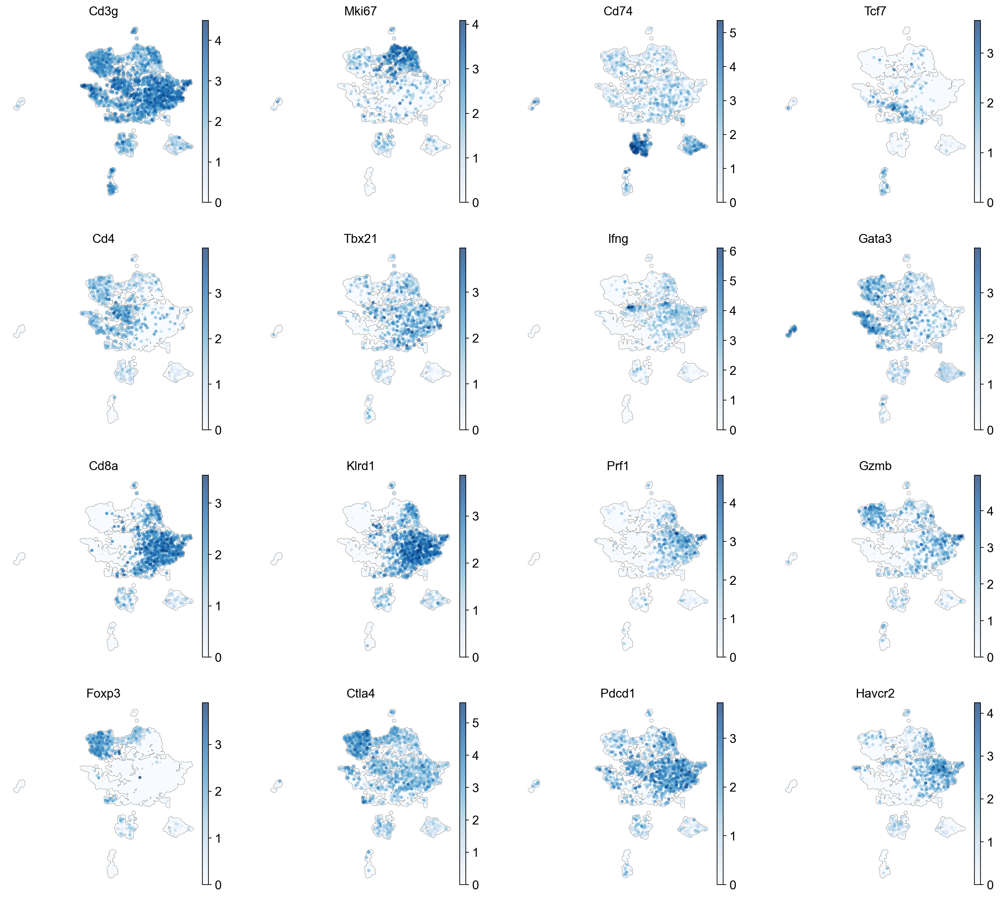

In [114]:
sc.pl.umap(adata_T, color=['Cd3g','Mki67','Cd74','Tcf7','Cd4','Tbx21','Ifng','Gata3','Cd8a','Klrd1','Prf1','Gzmb','Foxp3','Ctla4','Pdcd1','Havcr2'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Blues')

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


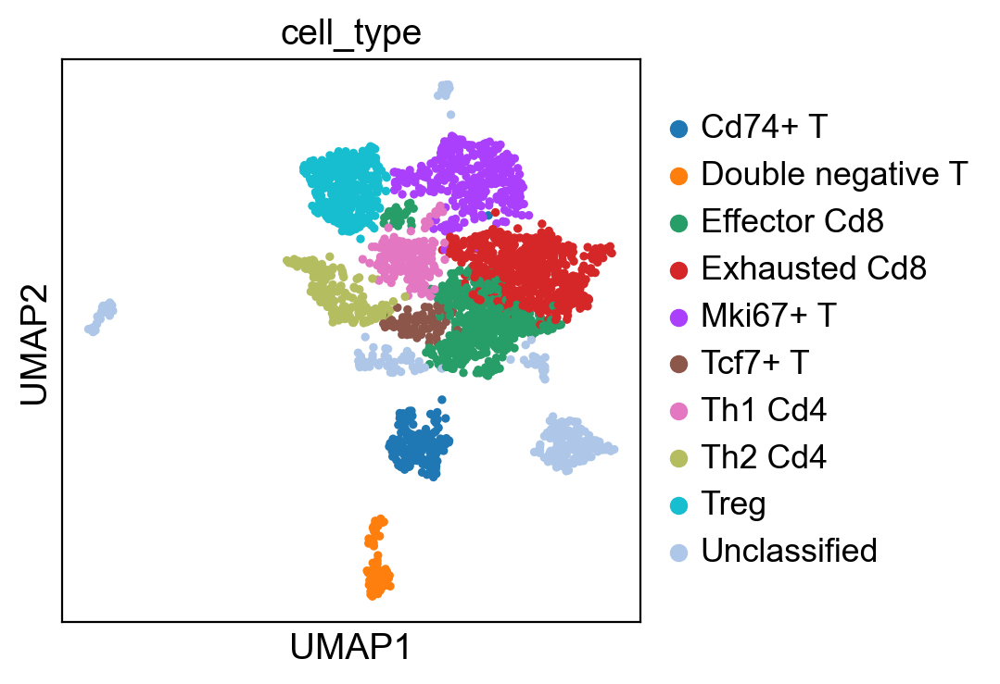

In [87]:
sc.pl.umap(adata_T, color=['cell_type'],legend_loc='right margin')

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


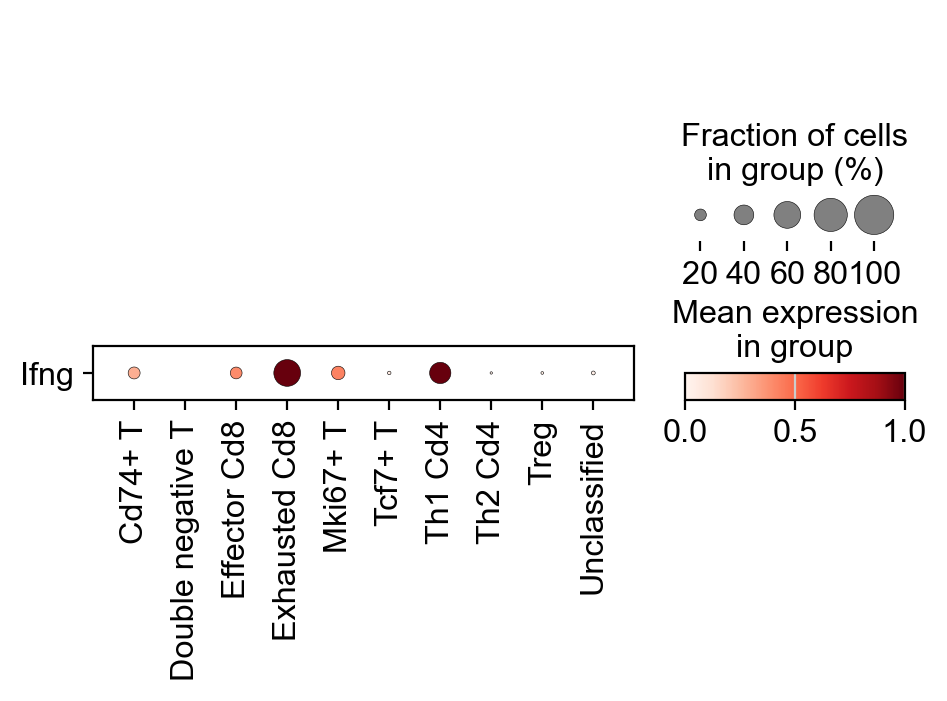

In [103]:
sc.pl.dotplot(adata_T[adata_T.obs['batch'].isin(['Mga_1','Mga_2','Mga_3'])], var_names=['Ifng'], groupby='cell_type', use_raw=True, var_group_rotation=0, vmin=0,vmax=1, swap_axes=True, dot_min=0,dot_max=1)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


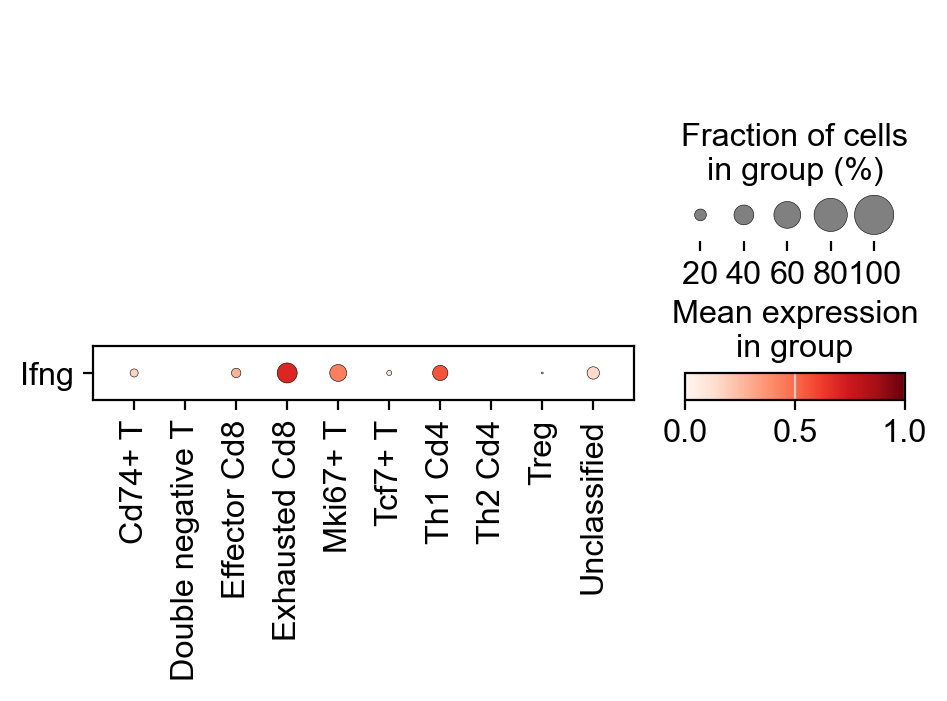

In [104]:
sc.pl.dotplot(adata_T[adata_T.obs['batch'].isin(['WT_1','WT_2','WT_3'])], var_names=['Ifng'], groupby='cell_type', use_raw=True, var_group_rotation=0, vmin=0,vmax=1, swap_axes=True, dot_min=0, dot_max=1)

In [99]:
sc.tl.rank_genes_groups(adata_T, groupby='cell_type', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  se

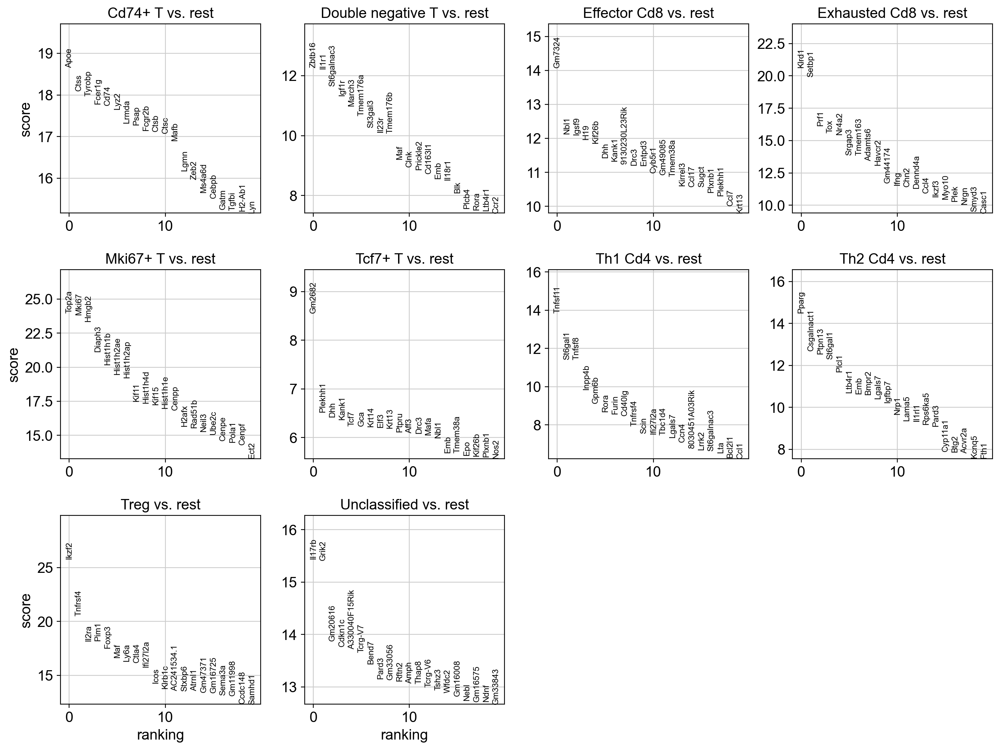

In [100]:
sc.pl.rank_genes_groups(adata_T, n_genes=20, sharey=False)

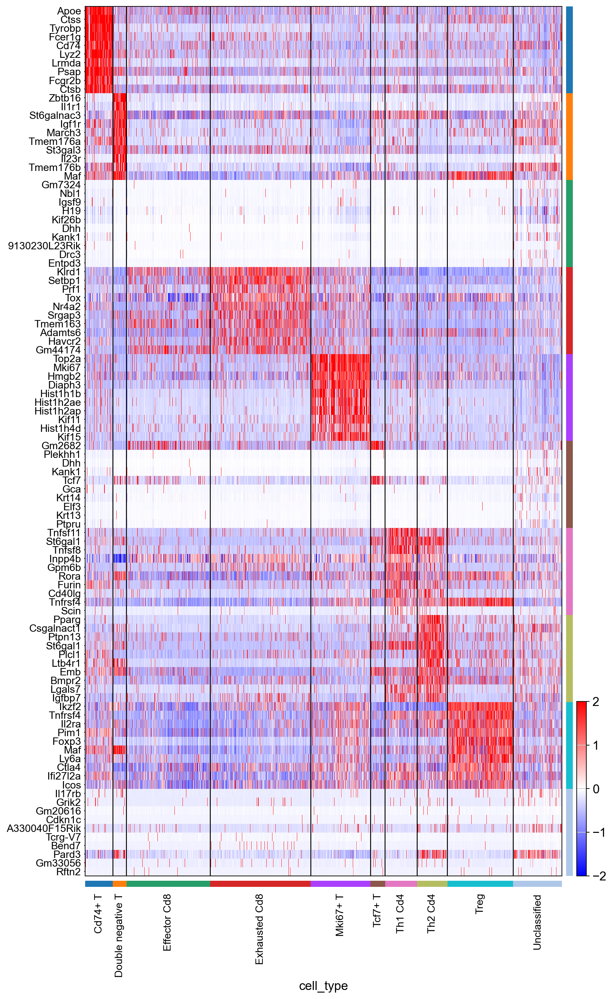

In [111]:
sc.pl.rank_genes_groups_heatmap(adata_T, n_genes=10, groupby='cell_type', use_raw=False, swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False)

In [102]:
# Supplementary Table
result = adata_T.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
  {group + '_' + key[:3]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_csv("/Users/fengxu/sc-RNA/T_Cluster_Markers_11092023.csv")

In [113]:
adata_T.write('/Users/fengxu/sc-RNA/T_subtypes_Figure5F.h5ad',compression='gzip')